In [1]:
#LIBRARIES:
#Tensors:
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.data as utils
import xarray

#E(2)-steerable CNNs - librar"y:
from e2cnn import gspaces                                          
from e2cnn import nn as G_CNN   
#import e2cnn

#Plotting in 2d/3d:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.patches import Ellipse,Rectangle
from matplotlib.colors import Normalize
import matplotlib.cm as cm
from mpl_toolkits.basemap import Basemap
#Tools:
import datetime
import sys

#Own files:
import ERA5_Dataset as Dataset

#HYPERPARAMETERS:
torch.set_default_dtype(torch.float)


In [2]:
PATH_TO_FILE="ERA5_US/Data/16_to_18_ERA5_US.nc"
MIN_N_CONT=5
MAX_N_CONT=100
N_TOTAL=None
BATCH_SIZE=50
N_ITERAT=100
VAR_NAMES=None#['wind_10m_east', 'wind_10m_north']

ERA5_WIND_DATA=Dataset.ERA5Dataset(PATH_TO_FILE,MIN_N_CONT,MAX_N_CONT,N_TOTAL,VAR_NAMES)
DATA_IDENTIFIER="ERA5_TEST"
#for i in range(3):
#    X_c,Y_c,X_t,Y_t=ERA5_WIND_DATA.get_rand_batch(batch_size=BATCH_SIZE)
#    print(X_c)
#    print(Y_c)


_______________________
Loaded weather data: 
-----
Shape:  (6504, 41, 41, 7)
Variables:  ['height_in_m', 'sp_in_kPa', 't_in_Cels', 'wind_10m_east', 'wind_10m_north', 'wind_100m_east', 'wind_100m_north']
West-East Longtitude:  tensor(-96.) tensor(-86.)
South-North Latitude:  tensor(30.) tensor(40.)
Grid points per map:  1681
________________________



In [5]:
def give_random_example(dataset):
    X,Y=dataset.get_rand_map(transform=False)
    Y_wind_low=Y[:,dataset.give_index_for_var(['wind_10m_east', 'wind_10m_north'])]
    Y_wind_high=Y[:,dataset.give_index_for_var(['wind_100m_east', 'wind_100m_north'])]
    Y_temp=Y[:,dataset.give_index_for_var(['t_in_Cels'])]
    Y_press=Y[:,dataset.give_index_for_var(['sp_in_kPa'])]
    Y_height=Y[:,dataset.give_index_for_var(['height_in_m'])]
    single_time="Unknown time"
    return(X,Y_wind_low,Y_wind_high,Y_temp,Y_press,Y_height,single_time)

tensor([[-93.0000,  34.2500],
        [-92.0000,  37.0000],
        [-93.2500,  35.0000],
        ...,
        [-90.7500,  30.5000],
        [-87.7500,  32.7500],
        [-90.7500,  37.2500]])
tensor([[-91.2500,  38.2500],
        [-93.0000,  32.0000],
        [-90.5000,  30.0000],
        ...,
        [-91.2500,  36.5000],
        [-90.5000,  39.2500],
        [-90.0000,  37.0000]])
tensor([[-95.0000,  33.2500],
        [-88.7500,  40.0000],
        [-95.0000,  34.5000],
        ...,
        [-86.5000,  33.7500],
        [-88.2500,  31.7500],
        [-91.5000,  31.5000]])
tensor([[-95.7500,  36.0000],
        [-92.7500,  32.7500],
        [-92.5000,  32.7500],
        ...,
        [-86.5000,  33.0000],
        [-86.7500,  36.2500],
        [-95.7500,  30.2500]])
tensor([[-91.2500,  30.7500],
        [-94.5000,  39.5000],
        [-96.0000,  30.5000],
        ...,
        [-91.0000,  37.5000],
        [-90.0000,  31.0000],
        [-88.5000,  31.0000]])


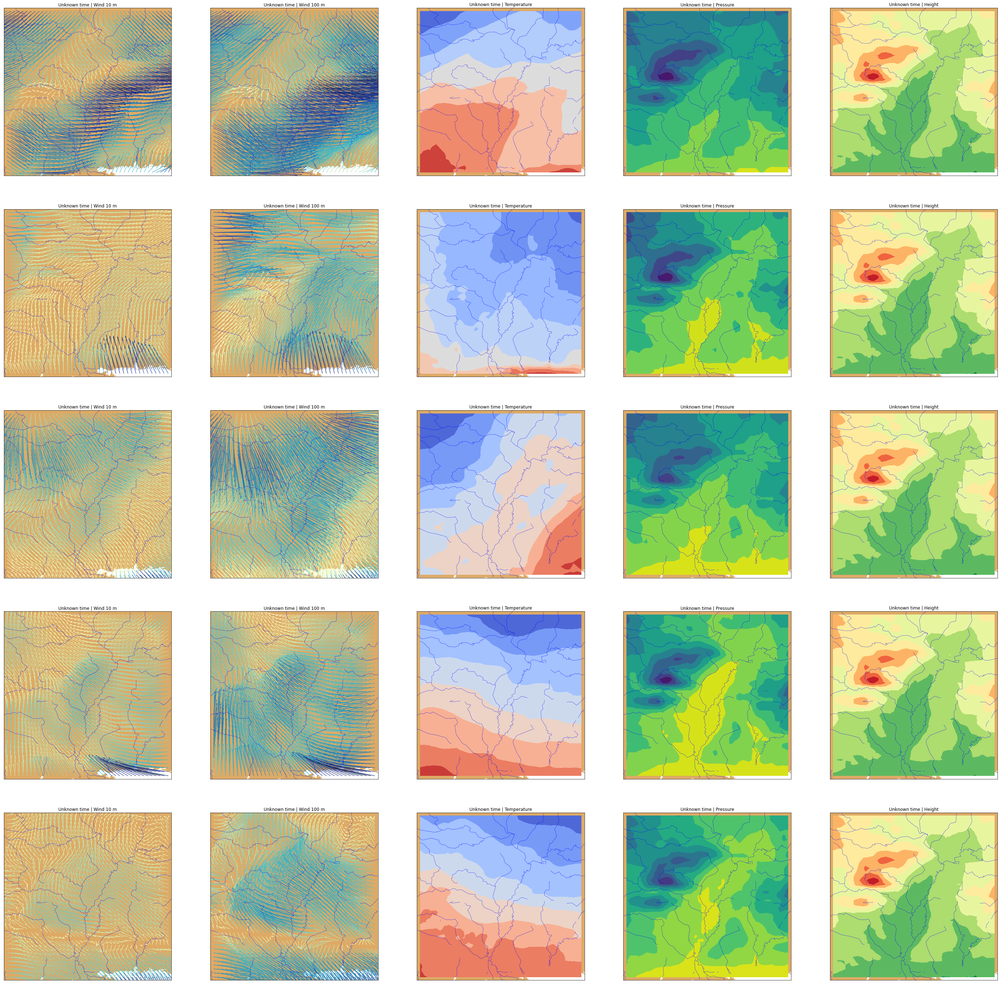

In [7]:
n_samples=5
n_var=5
#Example self-drawn plot:
fig,ax = plt.subplots(nrows=n_samples,ncols=n_var,figsize=(n_samples*10,n_var*10))
for i in range(n_samples):
    X,Y_wind_low,Y_wind_high,Y_temp,Y_press,Y_height,time=give_random_example(ERA5_WIND_DATA)
    for j in range(n_var):
        pass
        #US:
        m = Basemap(llcrnrlon=-96.2,llcrnrlat=29.8,urcrnrlon=-85.8,urcrnrlat=40.2, resolution='l',ax=ax[i][j])
        #China:
        #m = Basemap(llcrnrlon=104.8,llcrnrlat=24.8,urcrnrlon=115.2,urcrnrlat=35.2, resolution='l',ax=ax[i][j])
        #m.etopo(scale=scale, alpha=1,ax=ax)
        #m.drawmapboundary(fill_color='aqua',ax=ax)
        m.fillcontinents(color='#ddaa66', lake_color='aqua',zorder=0,ax=ax[i][j])
        m.drawrivers(color='#0000ff')
        #m.drawcoastlines()
    #Wind plot (Note that quiver takes the left-right and up-down magnitudes (since we have direction to the north we need to reverse it):
    m.quiver(X[:,0],X[:,1],Y_wind_low[:,0],-Y_wind_low[:,1],np.sqrt(Y_wind_low[:,0]**2+Y_wind_low[:,1]**2),ax=ax[i][0],scale=40,                        cmap=plt.cm.YlGnBu)
    ax[i][0].set_title(time+" | Wind 10 m")
    #Wind plot (Note that quiver takes the left-right and up-down magnitudes (since we have direction to the north we need to reverse it):
    m.quiver(X[:,0],X[:,1],Y_wind_high[:,0],-Y_wind_high[:,1],np.sqrt(Y_wind_high[:,0]**2+Y_wind_high[:,1]**2),ax=ax[i][1],scale=40,                        cmap=plt.cm.YlGnBu)
    ax[i][1].set_title(time+" | Wind 100 m")
    #Temperature plot:
    m.contourf(X[:,0],X[:,1],Y_temp,tri=True,ax=ax[i][2],cmap=plt.cm.coolwarm)
    ax[i][2].set_title(time+" | Temperature")
    #Pressure plot:
    m.contourf(X[:,0],X[:,1],Y_press,tri=True,ax=ax[i][3])
    ax[i][3].set_title(time+" | Pressure")
    #Height plot:
    m.contourf(X[:,0],X[:,1],Y_height,tri=True,ax=ax[i][4],cmap=plt.cm.RdYlGn_r)
    ax[i][4].set_title(time+" | Height")

fig.show()
plt.savefig("Test_plot_China.pdf")